# Analisi i predicció dels accidents de transit a Barcelona

In [1]:
# Import packages
import os
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, confusion_matrix
%matplotlib inline
import folium

# Dataset de les Persones accidentades

In [2]:
### Carreguem el dataset dels accidents del 2017
data_path = os.path.join(os.getcwd(), 'persones','2017_accidents_persones_gu_bcn_.csv')
accidents_persona2017 = pd.read_csv(data_path, delimiter = ',', encoding='latin-1')

### Mirem quina forma té el dataset
print('DataSet Persones - Nombre instances: {}, number of Training attributes: {}'.format(accidents_persona2017.shape[0], accidents_persona2017.shape[1]))


DataSet Persones - Nombre instances: 12148, number of Training attributes: 28


In [3]:
### Com que el fitxer té noms differents pels atributs, canviem els noms a mà.
accidents_persona2017.rename(columns={'NÃºmero_d\'expedient':'Codi_expedient'}, inplace=True)
accidents_persona2017.rename(columns={'Nom carrer':'Nom_carrer'}, inplace=True)
accidents_persona2017.rename(columns={'DescripciÃ³_dia_setmana':'Descripcio_dia_setmana'}, inplace=True)
accidents_persona2017.rename(columns={'Dia setmana':'Dia_setmana'}, inplace=True)
accidents_persona2017.rename(columns={'DescripciÃ³ tipus dia':'Descripcio_tipus_dia'}, inplace=True)
accidents_persona2017.rename(columns={'NK Any':'NK_Any'}, inplace=True)
accidents_persona2017.rename(columns={'Nom mes':'Nom_mes'}, inplace=True)
accidents_persona2017.rename(columns={'Dia de mes':'Dia_de_mes'}, inplace=True)
accidents_persona2017.rename(columns={'DescripciÃ³ torn':'Descripcio_torn'}, inplace=True)
accidents_persona2017.rename(columns={'Hora de dia':'Hora_de_dia'}, inplace=True)
accidents_persona2017.rename(columns={'Desc._Tipus_vehicle_implicat':'Descripcio_tipus_de_vehicle'}, inplace=True)
accidents_persona2017.rename(columns={'DescripciÃ³ causa vianant':'Descripcio_causa_vianant'}, inplace=True)
accidents_persona2017.rename(columns={'DescripciÃ³_sexe':'Descripcio_sexe'}, inplace=True)
accidents_persona2017.rename(columns={'DescripciÃ³_tipus_persona':'Descripcio_tipus_persona'}, inplace=True)
accidents_persona2017.rename(columns={'DescripciÃ³_situaciÃ³':'Descripcio_situacio'}, inplace=True)
accidents_persona2017.rename(columns={'DescripciÃ³_victimitzaciÃ³':'Descripcio_victimitzacio'}, inplace=True)
accidents_persona2017.rename(columns={'Long':'Longitud'}, inplace=True)
accidents_persona2017.rename(columns={'Lat':'Latitud'}, inplace=True)
accidents_persona2017.rename(columns={'Mes de any':'Mes_de_any'}, inplace=True)


In [4]:
### Fem neteja dels atributs, eliminant dades incorrectes.
accidents_persona2017 = accidents_persona2017[accidents_persona2017['Codi_districte'] > 0] #Eliminem els districtes -1
accidents_persona2017 = accidents_persona2017[accidents_persona2017['Codi_carrer'] > 0] #Eliminem els districtes -1

### Alguns agents de Guardia Urbana posaven Turismo i els altres Turisme... Ho hem passat tot a Turisme.
accidents_persona2017 = accidents_persona2017.replace({'Turismo': 'Turisme'}, regex=True)

### Seleccionar atributs d'especial interés per l'anàlisi.
atributs_selecionats = ['Codi_expedient', 'Descripcio_tipus_persona','Descripcio_tipus_de_vehicle','Descripcio_victimitzacio', 'Edat','Codi_barri','Codi_carrer','Hora_de_dia','Mes_de_any','Dia_de_mes','Longitud','Latitud' ]
copia_persones = accidents_persona2017[atributs_selecionats]


In [5]:
### Ja que volem saber si les persones van ser ferides lleus, greus o mortes, volem que els atributs 
### sigui tots iguals. Eliminant així els detall d'algunes entrades.
copia_persones = copia_persones.replace({'Ferit lleu: HospitalitzaciÃ³ fins a 24h':'Ferit lleu'}, regex=True)
copia_persones = copia_persones.replace({'Ferit greu: hospitalitzaciÃ³ superior a 24h':'Ferit greu'}, regex=True)
copia_persones = copia_persones.replace({'Ferit greu: hospitalitzaciÃ³ superior a 24h':'Ferit greu'}, regex=True)
copia_persones = copia_persones.replace({'Ferit lleu: Amb assistÃ¨ncia sanitÃ\xa0ria en lloc d\'accident':'Ferit lleu'}, regex=True)
copia_persones = copia_persones.replace({'Ferit lleu: Rebutja assistÃ¨ncia sanitÃ\xa0ria':'Ferit lleu'}, regex=True)
copia_persones['Descripcio_victimitzacio'] = copia_persones['Descripcio_victimitzacio'].replace("Mort (dins 24h posteriors accident)"
                                                                                                , "Mort")
### Perquè els canvis posteriors no afectin a tots els altres dataframes, en fem una copia.
dummy_persones = copia_persones.copy()                                          

### Fer binaries les variables dels ferits. One-Hot Econding.
dummy_persones = pd.concat([copia_persones, pd.get_dummies(copia_persones['Descripcio_victimitzacio'])], axis=1)

### Finalment posar el mateix nom de les columnes tant a Persones com a Accidents 
### (dataframe que veurem a continuació).
dummy_persones.rename(columns={'Ferit greu':'Num_Greus'}, inplace=True)
dummy_persones.rename(columns={'Ferit lleu':'Num_Lleus'}, inplace=True)
dummy_persones.rename(columns={'Mort':'Num_Morts'}, inplace=True)

dummy_persones


,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,Longitud,Latitud,Num_Greus,Num_Lleus,Num_Morts
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,2.14816,41.399482,0,1,0
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,2.185284,41.396355,0,1,0
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,2.180756,41.402529,0,1,0
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,2.191008,41.396801,0,1,0
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,2.191008,41.396801,0,1,0
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,2.166257,41.38468,0,1,0
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,2.163892,41.394706,0,1,0
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,2.163892,41.394706,0,1,0
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,2.139199,41.3805,0,1,0
9,2017S000010,Passatger,AutobÃºs,Ferit lleu,91,62,133300,12,1,1,2.180191,41.421792,0,1,0


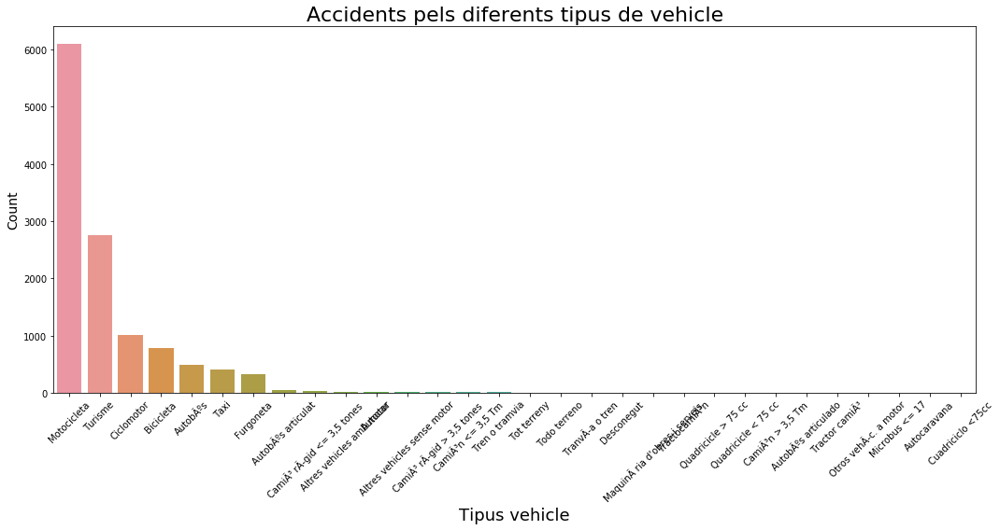

In [6]:
fig, ax = plt.subplots(figsize=(15,8))
ax = sns.countplot(x=dummy_persones["Descripcio_tipus_de_vehicle"], 
                   ax=ax,
                   order = dummy_persones["Descripcio_tipus_de_vehicle"].value_counts().index )

plt.xticks(rotation=45)
plt.xlabel('Tipus vehicle', fontsize=18)
plt.ylabel('Count', fontsize=14)
plt.title('Accidents pels diferents tipus de vehicle', fontsize=22)
plt.tight_layout()
plt.show()

* Com podem veure en el gràfic anterior, la majoria de vehicles accidentats són motocicletes.
* Es podrien reduir a 7 els tipus de vehicles accidentats a Barcelona sense perdre massa variança de les dades.

In [7]:
### Selecionem només fins a furgonetes.
select_vehicles = dummy_persones["Descripcio_tipus_de_vehicle"].value_counts().iloc[:7].index
dummy_persones = dummy_persones[dummy_persones["Descripcio_tipus_de_vehicle"].isin(select_vehicles)]

### Canviar les cel·les on Autobús està corromput.
dummy_persones = dummy_persones.replace({'AutobÃºs': 'Autobus'}, regex=True)

### Finalment també fem One Hot Encoding amb el tipus de vehicle accidentat.
dummy_persones = pd.concat([dummy_persones, pd.get_dummies(dummy_persones['Descripcio_tipus_de_vehicle'])], axis=1)

print('DataSet Persones accidentades - Nombre instances: {}, number of Training attributes: {}'.format(dummy_persones.shape[0], dummy_persones.shape[1]))
dummy_persones

DataSet Persones accidentades - Nombre instances: 11868, number of Training attributes: 22


,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Num_Greus,Num_Lleus,Num_Morts,Autobus,Bicicleta,Ciclomotor,Furgoneta,Motocicleta,Taxi,Turisme
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,0,1,0,0,0,0,0,0,0,1
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,...,0,1,0,0,0,0,0,1,0,0
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,0,1,0,0,0,0,0,1,0,0
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,0,1,0,0,0,1,0,0,0,0
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,0,1,0,0,0,1,0,0,0,0
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,...,0,1,0,0,1,0,0,0,0,0
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,...,0,1,0,0,0,0,0,1,0,0
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,...,0,1,0,0,0,0,0,1,0,0
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,0,1,0,0,0,1,0,0,0,0
9,2017S000010,Passatger,Autobus,Ferit lleu,91,62,133300,12,1,1,...,0,1,0,1,0,0,0,0,0,0


# Dataset Accidents

In [8]:
### Fem el mateix amb els ferits/accidentats l'any 2017.

### Lleguim el dataframe.
data_path = os.path.join(os.getcwd(), 'accidents_ferits','2017_accidents_gu_bcn.csv')
accidents_ferits = pd.read_csv(data_path, delimiter = ',', encoding='latin-1')
print('DataSet Accidents - Nombre instances: {}, number of Training attributes: {}'.format(accidents_ferits.shape[0], accidents_ferits.shape[1]))

### Eliminem els districtes -1
accidents_ferits = accidents_ferits[accidents_ferits['Codi districte'] > -1] 

DataSet Accidents - Nombre instances: 10339, number of Training attributes: 27


In [9]:
### Canviem el nom dels atributs per fer-los lleguibles.
accidents_ferits.rename(columns={'NÃºmero d\'expedient':'Codi_expedient'}, inplace=True)
accidents_ferits.rename(columns={'NÃºmero de morts':'Num_Morts'}, inplace=True)
accidents_ferits.rename(columns={'NÃºmero de lesionats lleus':'Num_Lleus'}, inplace=True)
accidents_ferits.rename(columns={'NÃºmero de lesionats greus':'Num_Greus'}, inplace=True)
accidents_ferits.rename(columns={'NÃºmero de vÃ­ctimes':'Num_Victimes'}, inplace=True)
accidents_ferits.rename(columns={'NÃºmero de vehicles implicats':'Num_Vehicles_Implicats'}, inplace=True)
accidents_ferits.rename(columns={'Dia setmana':'Dia_setmana'}, inplace=True)

### I per conveniència passem els valors numerics a enters.
accidents_ferits['Num_Morts'] = pd.to_numeric(accidents_ferits['Num_Morts'])
accidents_ferits['Num_Lleus'] = pd.to_numeric(accidents_ferits['Num_Lleus'])
accidents_ferits['Num_Greus'] = pd.to_numeric(accidents_ferits['Num_Greus'])
accidents_ferits['Num_Vehicles_Implicats'] = pd.to_numeric(accidents_ferits['Num_Vehicles_Implicats'])

### Mostrem per pantalla.
accidents_ferits

,Codi_expedient,Codi districte,Nom districte,Codi barri,Nom barri,Codi carrer,Nom carrer,Num postal caption,DescripciÃ³ dia setmana,Dia_setmana,...,DescripciÃ³ causa vianant,Num_Morts,Num_Lleus,Num_Greus,Num_Victimes,Num_Vehicles_Implicats,Coordenada UTM (X),Coordenada UTM (Y),Longitud,Latitud
4,2017S004615,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,226400,Las Navas de Tolosa ...,0323 0325,Dijous,Dj,...,No Ã©s causa del vianant,0,1,0,1,3,"432006,95","4585503,52",2.185272,41.416365
5,2017S007775,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,161407,IndÃºstria / Trinxant ...,0320 0322,Dimecres,Dc,...,No Ã©s causa del vianant,0,1,0,1,2,"431822,92","4585470,94",2.183245,41.416336
6,2017S004484,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,161407,Trinxant / IndÃºstria ...,0320 0322,Dissabte,Ds,...,No Ã©s causa del vianant,0,1,0,1,2,"431822,92","4585470,94",2.183245,41.416336
7,2017S010680,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,161407,IndÃºstria ...,0303 0303,Dimarts,Dm,...,No Ã©s causa del vianant,0,2,0,2,1,"431846,11","4585523,10",2.183561,41.416372
8,2017S005152,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,161407,IndÃºstria ...,0317 0317,Dilluns,Dl,...,Altres,0,1,0,1,1,"431894,47","4585568,41",2.184059,41.416763
9,2017S003932,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,194406,Maragall ...,0011 0011,Dimecres,Dc,...,No Ã©s causa del vianant,0,1,0,1,1,"431636,55","4585227,81",2.181225,41.413958
10,2017S010348,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,161407,IndÃºstria ...,0295 0295,Dijous,Dj,...,No Ã©s causa del vianant,0,1,0,1,2,"431757,04","4585439,98",2.182290,41.415772
11,2017S000245,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,224802,ST ANTONI M CLARET / Pg Maragall ...,0092 0092,Dimecres,Dc,...,No Ã©s causa del vianant,0,1,0,1,2,"431715,17","4585325,84",2.180453,41.415790
12,2017S005695,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,297001,Sant Antoni Maria Claret / GuinardÃ³ ...,0358 0358,Divendres,Dv,...,No Ã©s causa del vianant,0,1,0,1,2,"431690,10","4585511,58",2.181140,41.416295
13,2017S007384,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,297001,Sant Antoni Maria Claret ...,0258 0260,Dilluns,Dl,...,No Ã©s causa del vianant,0,0,1,1,2,"431235,61","4585067,59",2.176324,41.412546


In [10]:
### Seleccionem els atributs que ens interessen. Al tenir ja el dummy a les persones no ens caldrà aquí.
atributs_seleccionats =['Codi_expedient','Num_Victimes','Num_Vehicles_Implicats']
copia_accidents = accidents_ferits[atributs_seleccionats]
copia_accidents

,Codi_expedient,Num_Victimes,Num_Vehicles_Implicats
4,2017S004615,1,3
5,2017S007775,1,2
6,2017S004484,1,2
7,2017S010680,2,1
8,2017S005152,1,1
9,2017S003932,1,1
10,2017S010348,1,2
11,2017S000245,1,2
12,2017S005695,1,2
13,2017S007384,1,2


In [11]:
### Join dels Dataframe persones_dummy i Accidents
persones_accidentades = pd.merge(dummy_persones, copia_accidents, on = ['Codi_expedient'])
persones_accidentades

,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Num_Morts,Autobus,Bicicleta,Ciclomotor,Furgoneta,Motocicleta,Taxi,Turisme,Num_Victimes,Num_Vehicles_Implicats
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,0,0,0,0,0,0,0,1,1,1
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,...,0,0,0,0,0,1,0,0,1,2
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,0,0,0,0,0,1,0,0,1,2
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,0,0,0,1,0,0,0,0,2,3
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,0,0,0,1,0,0,0,0,2,3
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,...,0,0,1,0,0,0,0,0,1,1
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,...,0,0,0,0,0,1,0,0,2,2
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,...,0,0,0,0,0,1,0,0,2,2
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,0,0,0,1,0,0,0,0,1,2
9,2017S000010,Passatger,Autobus,Ferit lleu,91,62,133300,12,1,1,...,0,1,0,0,0,0,0,0,1,1


# Visualització dels accidents de la ciutat de Barcelona

* Note: Es necesita internet per renderitzar els mapes.

In [12]:
### Fem una copia de les dades, per evitar així alteracions.
persones_accidentades2 = persones_accidentades.copy()

### Passar les dades de les coordenades a numeric.
persones_accidentades2['Latitud'] = pd.to_numeric(persones_accidentades2['Latitud'])
persones_accidentades2['Longitud'] = pd.to_numeric(persones_accidentades2['Longitud'])
                                           
### Assegurar-nos que no sens hagi escapat cap error.    
df_accidents = persones_accidentades2[persones_accidentades2["Latitud"] > 0]
df_accidents = persones_accidentades2[persones_accidentades2["Longitud"] > 0]

### On serà ubicada la primera pàgina del mapa.
location = df_accidents['Latitud'].mean(), df_accidents['Longitud'].mean()

### Arrodonir els decimals per simplicitat.
lat_list = df_accidents["Latitud"].values.tolist()
long_list = df_accidents["Longitud"].values.tolist()

long_list =np.round(long_list,7)
lat_list = np.round(lat_list,7)

labels = persones_accidentades2["Descripcio_tipus_de_vehicle"].values.tolist()

### Crear un mapa de calor de tots els accidents que han tingut lloc a Barcelona el 2017.
from folium.plugins import MarkerCluster
from folium import plugins

### Definim la vista predefinida al iniciar el mapa.
myMap = folium.Map(location=[lat_list.mean(),long_list.mean()], zoom_start=12)

marker_cluster = MarkerCluster().add_to(myMap)

for i in range(0,len(lat_list)):
    popup = folium.Popup(labels[i], parse_html=True)
    folium.Marker(location=[lat_list[i], long_list[i]], 
                  popup=popup).add_to(marker_cluster)
    
# Convert to (n, 2) nd-array format for heatmap
matrix_loc = df_accidents[['Latitud', 'Longitud']].values

# Plot heatmap
myMap.add_child(plugins.HeatMap(matrix_loc, radius=15))

#Save map as .html
                            ### myMap.save('Mapa_accidents_Bcn_2017.html')
myMap ### Mostrar per pantalla.

# Densitat de població

In [13]:
### Ara d'afegir més atributs a les nostres dades. Començem amb la densitat de la població.
data_path = os.path.join(os.getcwd(), 'densitat_poblacio','2017_padro_ocupacio_mitjana.csv')
densitat_pobl = pd.read_csv(data_path, delimiter = ',', encoding='latin-1')

densitat_pobl.rename(columns={'PoblaciÃ³':'Poblacio'}, inplace=True)
densitat_pobl.rename(columns={'Codi_Barri':'Codi_barri'}, inplace=True)

select_atributs = ['Codi_barri','Poblacio']
densitat_pobl = densitat_pobl[select_atributs]

persones_accidentades2 = pd.merge(persones_accidentades2, densitat_pobl, on = ['Codi_barri'], how='left')
persones_accidentades2

,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Autobus,Bicicleta,Ciclomotor,Furgoneta,Motocicleta,Taxi,Turisme,Num_Victimes,Num_Vehicles_Implicats,Poblacio
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,0,0,0,0,0,0,1,1,1,47753
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,...,0,0,0,0,1,0,0,1,2,32048
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,0,0,0,0,1,0,0,1,2,51651
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,0,0,1,0,0,0,0,2,3,15204
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,0,0,1,0,0,0,0,2,3,15204
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,...,0,1,0,0,0,0,0,1,1,47986
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,...,0,0,0,0,1,0,0,2,2,44246
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,...,0,0,0,0,1,0,0,2,2,44246
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,0,0,1,0,0,0,0,1,2,41244
9,2017S000010,Passatger,Autobus,Ferit lleu,91,62,133300,12,1,1,...,1,0,0,0,0,0,0,1,1,14141


# Parc automobilistic

In [14]:
### Obrim la tipologia del parc de vehicles de Barcelona, on hi ha més motocicletes, cotxes...
data_path = os.path.join(os.getcwd(), 'parc_auto','2017_tipologia_parc_vehicles.csv')
parc_auto = pd.read_csv(data_path, delimiter = ',', encoding='latin-1')

### Esborrem codis d'error
parc_auto = parc_auto[parc_auto['Codi_Districte']<11]

##Selccionem atributs que ens interessen
select_colums = ['Codi_Barri','Nombre_vehicles','Tipologia_parc']
parc_auto = parc_auto[select_colums]

### Les agrupem per tipus de vehicle
parc_groupby = parc_auto.groupby(['Codi_Barri','Tipologia_parc'],as_index=False).sum()

### Noms amb coherència amb les dades anteriors.
parc_groupby.rename(columns={'Codi_Barri':'Codi_barri'}, inplace=True)
parc_groupby.rename(columns={'Tipologia_parc':'Descripcio_tipus_de_vehicle'}, inplace=True)
parc_groupby.rename(columns={'Nombre_vehicles':'Nombre_vehicles_parc'}, inplace=True)

### En aquest cas les dades del dataframe per ajustar-se a les que ja tenim.
parc_groupby = parc_groupby.replace({'Turismes': 'Turisme'}, regex=True)
parc_groupby = parc_groupby.replace({'Motos': 'Motocicleta'}, regex=True)
parc_groupby = parc_groupby.replace({'Ciclomotors': 'Ciclomotor'}, regex=True)
parc_groupby = parc_groupby.replace({'Furgonetes': 'Furgoneta'}, regex=True)

### Left join per ajuntarho amb dades anteriors.
persones_accidentades3 = pd.merge(persones_accidentades2, parc_groupby, on = ['Codi_barri','Descripcio_tipus_de_vehicle'], how='left')

### Omplir el nomber de vehicles al parc amb 0, ja que no tenim dades.
persones_accidentades3['Nombre_vehicles_parc'] = persones_accidentades3['Nombre_vehicles_parc'].fillna(0)

## Passem el nombre de vehicles a enter
persones_accidentades3["Nombre_vehicles_parc"] = persones_accidentades3["Nombre_vehicles_parc"].astype(int)

persones_accidentades3


,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Bicicleta,Ciclomotor,Furgoneta,Motocicleta,Taxi,Turisme,Num_Victimes,Num_Vehicles_Implicats,Poblacio,Nombre_vehicles_parc
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,0,0,0,0,0,1,1,1,47753,26740
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,...,0,0,0,1,0,0,1,2,32048,4284
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,0,0,0,1,0,0,1,2,51651,6904
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,0,1,0,0,0,0,2,3,15204,504
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,0,1,0,0,0,0,2,3,15204,504
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,...,1,0,0,0,0,0,1,1,47986,0
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,...,0,0,0,1,0,0,2,2,44246,9007
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,...,0,0,0,1,0,0,2,2,44246,9007
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,0,1,0,0,0,0,1,2,41244,1432
9,2017S000010,Passatger,Autobus,Ferit lleu,91,62,133300,12,1,1,...,0,0,0,0,0,0,1,1,14141,0


# Sortides i postes de Sol

In [15]:
### Lleguim dataframe.
data_path = os.path.join(os.getcwd(), 'sortida_posta_sol','sortida_posta_2017.csv')
sortida_posta_sol = pd.read_csv(data_path, delimiter = ';', encoding='latin-1')

### Netejem i treiem les columnes que no ens interessen.
sortida_posta_sol["salida"] = sortida_posta_sol["salida"].str.replace(":",".").astype(float)
sortida_posta_sol["puesta"] = sortida_posta_sol["puesta"].str.replace(":",".").astype(float)
sortida_posta_sol.drop(['cenit'], axis=1, inplace=True)

### Arrodonim totes les hores cap aball, ja que els accidents les hores també són int.
sortida_posta_sol = sortida_posta_sol.astype(int)

### Posem el mateix nom a les columnes que volem fer el join
sortida_posta_sol.rename(columns={'dia':'Dia_de_mes'}, inplace=True)
sortida_posta_sol.rename(columns={'mes':'Mes_de_any'}, inplace=True)
sortida_posta_sol.rename(columns={'any':'Any'}, inplace=True)
sortida_posta_sol.rename(columns={'salida':'Sortida_Sol'}, inplace=True)
sortida_posta_sol.rename(columns={'puesta':'Posta_Sol'}, inplace=True)

sortida_posta_sol

,Dia_de_mes,Mes_de_any,Any,Sortida_Sol,Posta_Sol
0,1,1,2017,8,17
1,2,1,2017,8,17
2,3,1,2017,8,17
3,4,1,2017,8,17
4,5,1,2017,8,17
5,6,1,2017,8,17
6,7,1,2017,8,17
7,8,1,2017,8,17
8,9,1,2017,8,17
9,10,1,2017,8,17


In [16]:
### Left join per ajuntarho amb dades anteriors.
persones_accidentades4 = pd.merge(persones_accidentades3, sortida_posta_sol, on = ['Dia_de_mes','Mes_de_any'], how='left')
persones_accidentades4

,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Motocicleta,Taxi,Turisme,Num_Victimes,Num_Vehicles_Implicats,Poblacio,Nombre_vehicles_parc,Any,Sortida_Sol,Posta_Sol
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,0,0,1,1,1,47753,26740,2017,8,17
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,...,1,0,0,1,2,32048,4284,2017,8,17
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,1,0,0,1,2,51651,6904,2017,8,17
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,0,0,0,2,3,15204,504,2017,8,17
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,0,0,0,2,3,15204,504,2017,8,17
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,...,0,0,0,1,1,47986,0,2017,8,17
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,...,1,0,0,2,2,44246,9007,2017,8,17
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,...,1,0,0,2,2,44246,9007,2017,8,17
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,0,0,0,1,2,41244,1432,2017,8,17
9,2017S000010,Passatger,Autobus,Ferit lleu,91,62,133300,12,1,1,...,0,0,0,1,1,14141,0,2017,8,17


In [17]:
### Ara creerem una columna per veure la diferencia entre la hora que va passar l'accident 
### i la sortida o posata de sol.

persones_accidentades4['Dif_Sortida_Sol'] = abs(persones_accidentades4['Hora_de_dia'] - persones_accidentades4['Sortida_Sol'])
persones_accidentades4['Dif_Posta_Sol'] = abs(persones_accidentades4['Hora_de_dia'] - persones_accidentades4['Posta_Sol'])
persones_accidentades4['Dif_PostaoSortida_Sol'] = persones_accidentades4[["Dif_Sortida_Sol", "Dif_Posta_Sol"]].min(axis=1)
persones_accidentades4

,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Num_Victimes,Num_Vehicles_Implicats,Poblacio,Nombre_vehicles_parc,Any,Sortida_Sol,Posta_Sol,Dif_Sortida_Sol,Dif_Posta_Sol,Dif_PostaoSortida_Sol
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,1,1,47753,26740,2017,8,17,4,13,4
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,...,1,2,32048,4284,2017,8,17,6,15,6
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,1,2,51651,6904,2017,8,17,1,10,1
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,2,3,15204,504,2017,8,17,1,10,1
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,2,3,15204,504,2017,8,17,1,10,1
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,...,1,1,47986,0,2017,8,17,3,6,3
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,...,2,2,44246,9007,2017,8,17,2,7,2
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,...,2,2,44246,9007,2017,8,17,2,7,2
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,1,2,41244,1432,2017,8,17,6,3,3
9,2017S000010,Passatger,Autobus,Ferit lleu,91,62,133300,12,1,1,...,1,1,14141,0,2017,8,17,4,5,4


# Densitat de semàfors als barris

In [18]:
### Ara farem el mateix però amb les coordenades del samafor més proper.
### Lleguim dataframe.
data_path = os.path.join(os.getcwd(), 'semafors_loc','Infraestructures_Inventari_Semafors.csv')
semafors_loc = pd.read_csv(data_path, delimiter = ',', encoding='latin-1')
semafors = semafors_loc.copy()

### Seleccionem els atributs que ens interessen
semafors_select = ['ID_Semafor','Codi_Barri','Longitud','Latitud']
semafors_loc = semafors_loc[semafors_select]
semafors_loc.dropna(inplace=True)
semafors_loc.rename(columns={'Codi_Barri':'Codi_barri'}, inplace=True)

densitat_semf_barri = semafors_loc.groupby(['Codi_barri'])["Codi_barri"].count().reset_index(name="Num_Semaf_Barri")
densitat_semf_barri

semafors

,ID_Semafor,Codi_Semafor,Codi_Districte,Nom_Districte,Codi_Barri,Nom_Barri,Longitud,Latitud,X_ETRS89,Y_ETRS89,Data_Alta
0,415227,ArmarioSim,NaN,NaN,NaN,NaN,2.094896,41.375543,424312.672,4580842.381,1900/01/01
1,415228,ArmarioSim,NaN,NaN,NaN,NaN,2.091653,41.369542,424034.492,4580179.061,1900/01/01
2,415229,ArmarioSim,NaN,NaN,NaN,NaN,2.089232,41.355098,423815.166,4578577.595,1900/01/01
3,415242,ArmarioSim,NaN,NaN,NaN,NaN,2.225559,41.418246,435281.562,4585477.333,1900/01/01
4,415243,ArmarioSim,NaN,NaN,NaN,NaN,2.220889,41.421307,434894.303,4585820.716,1900/01/01
5,415244,ArmarioSim,NaN,NaN,NaN,NaN,2.216116,41.425128,434499.275,4586248.480,1900/01/01
6,415245,ArmarioSim,NaN,NaN,NaN,NaN,2.210935,41.432734,434074.096,4587096.885,1900/01/01
7,415269,Col2400,NaN,NaN,NaN,NaN,2.095407,41.376060,424355.992,4580899.381,1900/01/01
8,415270,Col2400,NaN,NaN,NaN,NaN,2.090354,41.367153,423923.072,4579914.951,1900/01/01
9,415271,Col2400,NaN,NaN,NaN,NaN,2.088800,41.360935,423785.832,4579226.071,1900/01/01


In [19]:
### Ho afegim al nostre dataframe
### Left join per ajuntarho amb dades anteriors.

persones_accidentades5 = pd.merge(persones_accidentades4, densitat_semf_barri, on = ['Codi_barri'], how='left')
persones_accidentades5


,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Num_Vehicles_Implicats,Poblacio,Nombre_vehicles_parc,Any,Sortida_Sol,Posta_Sol,Dif_Sortida_Sol,Dif_Posta_Sol,Dif_PostaoSortida_Sol,Num_Semaf_Barri
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,1,47753,26740,2017,8,17,4,13,4,3620
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,...,2,32048,4284,2017,8,17,6,15,6,2929
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,2,51651,6904,2017,8,17,1,10,1,3058
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,3,15204,504,2017,8,17,1,10,1,3594
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,3,15204,504,2017,8,17,1,10,1,3594
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,...,1,47986,0,2017,8,17,3,6,3,967
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,...,2,44246,9007,2017,8,17,2,7,2,8472
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,...,2,44246,9007,2017,8,17,2,7,2,8472
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,2,41244,1432,2017,8,17,6,3,3,1462
9,2017S000010,Passatger,Autobus,Ferit lleu,91,62,133300,12,1,1,...,1,14141,0,2017,8,17,4,5,4,811


# Distància entre accident i semafors

In [20]:
### Arrodonim la seva localització perquè els semafors propers contin com a un. 
### Ho arrodonim a 4 decimals perquè els semafors propers tinguin les mateixes coordenades i per tant reduim així
### el nombre de semàfors amb els que compararem la distància.
semafors_loc['Latitud'] = semafors_loc['Latitud'].round(decimals=4)
semafors_loc['Longitud'] = semafors_loc['Longitud'].round(decimals=4)

### Agrupem tots aquells semadors que estan a la mateixa ubicació
semafors_loc_simpli = semafors_loc.groupby(['Longitud','Latitud','Codi_barri'],as_index=False).count()

### Ajustem els atributs perquè siguin després similars amb l'altre Dataframe.
semafors_loc_simpli.rename(columns={'ID_Semafor':'Count_Semafor'}, inplace=True)
semafors_loc_simpli['Codi_barri'] = semafors_loc_simpli['Codi_barri'].astype('int64')

### Finalment, per si de cas encara quedes algun duplicat, l'esborrem.
semafors_loc_simpli.drop_duplicates(subset=['Longitud', 'Latitud'], keep='first', inplace=True)


semafors_loc_simpli


,Longitud,Latitud,Codi_barri,Count_Semafor
0,2.0953,41.4214,22,2
1,2.0954,41.4215,22,1
2,2.0966,41.4199,22,1
3,2.0966,41.4200,22,3
4,2.0967,41.4200,22,5
5,2.0968,41.4198,22,1
6,2.0968,41.4200,22,3
7,2.0969,41.4198,22,3
8,2.0970,41.4195,22,6
9,2.0970,41.4196,22,3


### Ara ho fem amb els accidents

In [216]:
### Seleccionem els atributs que ens interessen.
selecionar_col = ['Longitud','Latitud','Codi_barri']
accidents_loc = persones_accidentades5[selecionar_col]

### Com abans també modifiquem els etributs perquè siguin semblants.
accidents_loc = accidents_loc.astype(float)
accidents_loc['Codi_barri'] = accidents_loc['Codi_barri'].astype('int64')

### Ja que un codi d'accident té diferents cotxes amb la mateixa localització, esborrem els valors repetits 
### i només deixem el primer.
accidents_loc.drop_duplicates(subset=['Longitud', 'Latitud'], keep='first', inplace=True)
accidents_loc

### Adequem les dades perquè tinguin els mateixos noms.
accidents_loc.rename(columns={'Latitud':'Latitud_acc'}, inplace=True)
accidents_loc.rename(columns={'Longitud':'Longitud_acc'}, inplace=True)
accidents_loc['Dist_semaf'] = 0

accidents_loc



,Longitud_acc,Latitud_acc,Codi_barri,Dist_semaf
0,2.148160,41.399482,26,0
1,2.185284,41.396355,5,0
2,2.180756,41.402529,6,0
3,2.191008,41.396801,66,0
5,2.166257,41.384680,1,0
6,2.163892,41.394706,7,0
8,2.139199,41.380500,18,0
9,2.180191,41.421792,62,0
10,2.199915,41.391332,67,0
11,2.182109,41.401530,5,0


In [25]:
### Amb aquest codi hem calculat la distància geodesica entre cada accident i semàfor.

### Un nested for loop per anar passant per les coordenades de semàfors i accidents.
from geopy.distance import geodesic

for i in range(len(accidents_loc)):
    distancia = []
    
    for j in range(len(semafors_loc_simpli)):
        if accidents_loc.iloc[i,2] == semafors_loc_simpli.iloc[j,2]:
            num = geodesic(accidents_loc.iloc[i,0:2], semafors_loc_simpli.iloc[j,0:2]).km
            distancia.append(num)           
    print(min(distancia))    
    accidents_loc.iloc[i,3] = min(distancia)
    
# ################################ prova1.to_csv('Distanca_accidents.csv')

    
# # Una línia ortodròmica o ortodròmia[1] és el camí més curt 
# # entre dos punts de la superfície terrestre, és l'arc de cercle màxim, 
# # menor de 180 graus, que els uneix.
# ### Wikipedia

* La cel·la anterior tarda molt en executar-se així que es va crear un fitxer per no haver de repetir els calculs resultants.

# Resultats

* Com podem veure a continuació, la descipció dels resultats marca que el 75% dels accidents passen a menys de 100 metres d'algun dels semàfors de la ciutat.
* Hi ha valors fins a 2 kilometres i mig de distància, cosa estranya. Suspitem que aquestes dades són degut a que aquests accidents han passat luny de zones habitades com ara el Port o Collserola. Nem a veure-ho.

In [218]:
### Carregar el csv de les dades amb les distàncies guardades previament.
data_path = os.path.join(os.getcwd(),'Distanca_accidents3.csv')
accidents_loc = pd.read_csv(data_path, delimiter = ',', encoding='latin-1')
accidents_loc.drop(['Unnamed: 0'], axis=1, inplace=True)
print('Quartil 99 conté una distància de: {0:.5f} km'.format(accidents_loc['Dist_semaf'].quantile(q=0.99)))
print("És a dir, el 99% de les dades tenen una distància menor de 0.934km.")
accidents_loc.describe()

Quartil 99 conté una distància de: 0.93425 km
És a dir, el 99% de les dades tenen una distància menor de 0.934km.


,Longitud,Latitud,Codi_barri,Dist_semaf
count,6575.000000,6575.000000,6575.000000,6575.000000
mean,2.162559,41.400309,27.897643,0.079320
std,0.023900,0.021391,21.891990,0.172399
min,2.095684,41.322371,1.000000,0.000111
25%,2.145143,41.386580,8.000000,0.010700
50%,2.162814,41.398079,23.000000,0.029077
75%,2.179683,41.412379,43.000000,0.090196
max,2.222694,41.466991,73.000000,2.482727


# Mapa densitat de semàfors a Barcelona

* Mirem la distància més gran per veure si tenen sentit.

In [27]:
### Mirem les dades més grans del quartil 99 - 0.93425km que els aproximem a 1km.
valors_grans = accidents_loc[accidents_loc['Dist_semaf']>1]
valors_grans

,Longitud,Latitud,Codi_barri,Dist_semaf
138,2.118224,41.324575,12,1.745156
145,2.129109,41.429532,39,1.036405
210,2.139089,41.323490,12,2.386314
401,2.117594,41.325237,12,1.687430
409,2.105897,41.337325,12,1.707219
412,2.109304,41.332874,12,1.526351
526,2.122827,41.330573,12,1.065939
591,2.112070,41.332536,12,1.298631
753,2.121202,41.327904,12,1.345651
784,2.123129,41.427469,39,1.656640


In [30]:
### Arrodonir els decimals per simplicitat.
### El mapa és

### SEMAFORS ###
lat_list2 = semafors_loc["Latitud"].values.tolist()
long_list2 = semafors_loc["Longitud"].values.tolist()

long_list2 =np.round(long_list,7)
lat_list2 = np.round(lat_list,7)

labels = valors_grans["Dist_semaf"].values.tolist() ### NO VA
labels = np.round(labels,0)

myMap2 = folium.Map(location=[lat_list2.mean(),long_list2.mean()], zoom_start=12)
marker_cluster2 = MarkerCluster().add_to(myMap)
 
for i in range(0,len(lat_list2)):
    folium.CircleMarker(location=[lat_list2[i], long_list2[i]], radius=10).add_to(marker_cluster2)

### ACCIDENTS ###
lat_list_GRANS = valors_grans["Latitud"].values.tolist()
long_list_GRANS = valors_grans["Longitud"].values.tolist()

lat_list_GRANS =np.round(lat_list_GRANS,7)
long_list_GRANS = np.round(long_list_GRANS,7)    
    
for j in range(0,len(valors_grans)):
    popup = folium.Popup(labels[j], parse_html=True)
    folium.Marker(location=[lat_list_GRANS[j],long_list_GRANS[j]], popup=popup).add_to(myMap2)

# Convert to (n, 2) nd-array format for heatmap
matrix_loc2 = semafors_loc[['Latitud', 'Longitud']].values

# Plot heatmap
myMap2.add_child(plugins.HeatMap(matrix_loc2, radius=10))

# myMap2.save('Mapa_semafors_bo.html')
myMap2

###### Com podem veure no és que les dades siguin incorrectes sinò que són zones apartades no urbanes.

# Finalment ajuntem els dataframes

In [234]:
### Ajuntar els resultats anteriors amb el nostre dataframe principal.
accidents_loc.rename(columns={'Latitud_acc':'Latitud'}, inplace=True)
accidents_loc.rename(columns={'Longitud_acc':'Longitud'}, inplace=True)

persones_accidentades7 = pd.merge(persones_accidentades5, 
                                  accidents_loc, 
                                  on = ['Codi_barri','Longitud','Latitud'])

persones_accidentades8 = persones_accidentades7.copy()                                          
persones_accidentades8


,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Poblacio,Nombre_vehicles_parc,Any,Sortida_Sol,Posta_Sol,Dif_Sortida_Sol,Dif_Posta_Sol,Dif_PostaoSortida_Sol,Num_Semaf_Barri,Dist_semaf
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,47753,26740,2017,8,17,4,13,4,3620,0.114346
1,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,51651,6904,2017,8,17,1,10,1,3058,0.017774
2,2017S006713,Passatger,Taxi,Ferit lleu,34,6,89004,3,8,3,...,51651,0,2017,6,21,3,18,3,3058,0.017774
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,15204,504,2017,8,17,1,10,1,3594,0.034187
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,15204,504,2017,8,17,1,10,1,3594,0.034187
5,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,41244,1432,2017,8,17,6,3,3,1462,0.102083
6,2017S000014,Conductor,Motocicleta,Ferit lleu,50,18,270209,16,1,1,...,41244,5241,2017,8,17,8,1,1,1462,0.102083
7,2017S002395,Passatger,Taxi,Ferit lleu,24,18,270209,22,3,24,...,41244,0,2017,6,19,16,3,3,1462,0.102083
8,2017S002395,Conductor,Taxi,Ferit lleu,47,18,270209,22,3,24,...,41244,0,2017,6,19,16,3,3,1462,0.102083
9,2017S000011,Conductor,Bicicleta,Ferit lleu,29,67,700662,15,1,1,...,9404,0,2017,8,17,7,2,2,1725,0.036639


# ==========Estacions meteorologiques==========

###### S'ha aconseguit tenir la base de dades de les estacions meteorològiques de la ciutat de Barcelona l'any 2017 gràcies al Meteocat.
###### Sens va proporcionar les dades de 6 estacions meteorològiques, aquestes van ser:
* Barcelona - Observatori Fabra
* Barcelona - el Raval
* Barcelona - Zona Universitària
* Port de Barcelona - Bocana Sud
* Port de Barcelona - ZAL Prat
* Barcelona - Zoo

###### Degut a  que les estacions de la Bocana Sud del port i del Zoo tenien menys dades, hem deixat fora aquestes estacions i ens centrarem en les altres 4.

## ========== Localització de les estacions i clustering ==========

##### Començem netejant el dataframe de les ubicacions de les estacions i a continuació asignarem a cada accident, una estació que sigui la més pròxima amb l'ajuda del KMeans 

### Estacions

In [32]:
### Lleguir dataframe
data_path = os.path.join(os.getcwd(),'meteorologia', 'loc_estacions.csv')
loc_estacions = pd.read_csv(data_path, delimiter = ';', encoding='latin-1', decimal=",")

### Excloure els que no son nombres i treure les estacions del Port i Zoo com hem explicat abans.
loc_estacions.dropna(inplace=True)
loc_estacions.drop(loc_estacions.index[[3,5]],inplace=True)

### Per inicialitzar el centroides ho convertim en array
localitzacio = ['Latitud','Longitud']
centroides_estacio = np.array(loc_estacions[localitzacio])

loc_estacions

,Codi,Nom,Latitud,Longitud
0,D5,Barcelona - Observatori Fabra,41.41843,2.12388
1,X4,Barcelona - el Raval,41.38390,2.16775
2,X8,Barcelona - Zona Universitària,41.37919,2.10540
4,Y9,Port de Barcelona - ZAL Prat,41.31723,2.13091


### Clustering

In [250]:
# ### Creem la variable X que serà les ubicacions dels accidents.
# localitzacio = ['Latitud','Longitud']
# X = persones_accidentades7[localitzacio]
# X_array = X.values

# init=(loc_estacions[localitzacio]).values

# ### Crearem un total de 4 clusters, un per cada estació.
# from sklearn.cluster import KMeans
# kmeans = KMeans(n_clusters=len(loc_estacions), 
#                 init = init).fit(X_array)
# centroids = kmeans.cluster_centers_
# print("Coordenades dels centres dels clusters of cluster centers: \n", kmeans.cluster_centers_)

# labels_X = kmeans.predict(X_array)
# X['Cluster'] = labels_X
# X


* Clustering ha resultat no ser una bona opció ja que és un mètode NO supervisat i per tant, el que fa és fer clusteres amb dades pròximes però el centroide s'inicialitza de forma aleatòria.

In [266]:
### Distància minima per determinar l'estació més pròxima a l'accident
accidents_estacions['Cluster2']=0

for i in range(len(accidents_estacions)):
    distancia = []
    
    for j in range(len(loc_estacions)):
        num = geodesic(accidents_estacions.iloc[i,0:2], loc_estacions.iloc[j,2:4]).km
        distancia.append(num)           
    print(distancia.index(min(distancia)))
    accidents_estacions.iloc[i,2] = distancia.index(min(distancia))

In [277]:
# X.to_csv('Clusters_accidents.csv')
data_path = os.path.join(os.getcwd(),'Clusters_accidents.csv')
X = pd.read_csv(data_path, delimiter = ',', encoding='latin-1')
X.drop(['Unnamed: 0'], axis=1, inplace=True)
X

,Latitud,Longitud,Cluster,Cluster2
0,41.399482,2.148160,2,1
1,41.396355,2.185284,1,1
2,41.402529,2.180756,1,1
3,41.396801,2.191008,1,1
4,41.396801,2.191008,1,1
5,41.384680,2.166257,3,1
6,41.394706,2.163892,3,1
7,41.394706,2.163892,3,1
8,41.380500,2.139199,3,1
9,41.421792,2.180191,0,1


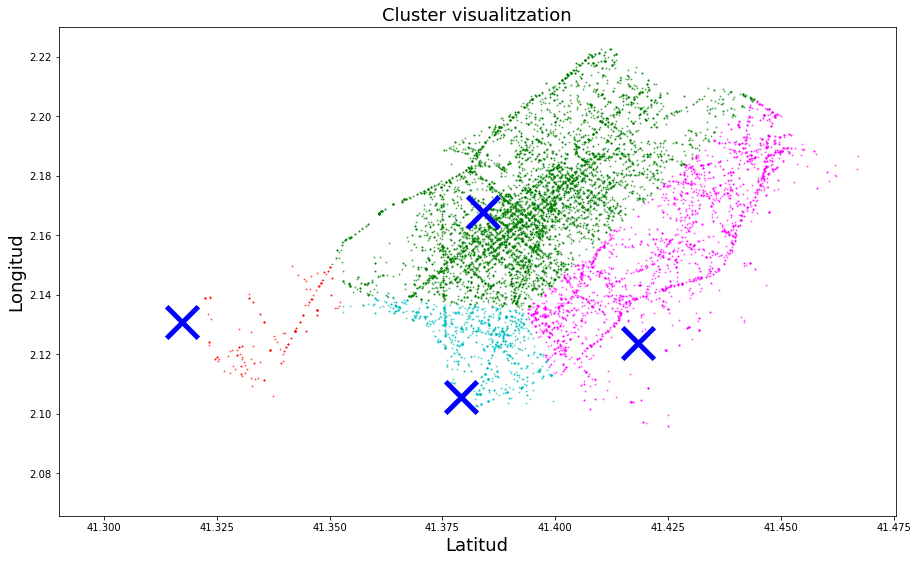

In [283]:
# # Shape of the plot
fig, ax1 = plt.subplots(figsize=(15, 9))

# # Get the centroids and plot them
plt.scatter(loc_estacions.iloc[:, 2], loc_estacions.iloc[:, 3], marker='x', s=1000, linewidth=5, color='b', zorder=100)

# # Plot the data
for k in range(len(X)):
    if X.iloc[k, 3]==0:
        plt.plot(X.iloc[k, 0], X.iloc[k, 1], 'k.', markersize=2, alpha=0.5,color='magenta') # Datapoints
    if X.iloc[k, 3]==1:
        plt.plot(X.iloc[k, 0], X.iloc[k, 1], 'k.', markersize=2, alpha=0.5,color='g') # Datapoints
    if X.iloc[k, 3]==2:
        plt.plot(X.iloc[k, 0], X.iloc[k, 1], 'k.', markersize=2, alpha=0.5,color='c') # Datapoints
    if X.iloc[k, 3]==3:
        plt.plot(X.iloc[k, 0], X.iloc[k, 1], 'k.', markersize=2, alpha=0.5,color='red') # Datapoints
        
# # Label the data
plt.xlabel('Latitud', fontsize=18)
plt.ylabel('Longitud', fontsize=18)
plt.title('Cluster visualitzation', fontsize=18)

plt.show()

In [50]:
### SEMAFORS ###
lat_X = X["Latitud"].values.tolist()
long_X = X["Longitud"].values.tolist()

lat_X = np.round(lat_list,7)
long_X =np.round(long_list,7)

# labels = valors_grans["Dist_semaf"].values.tolist() ### NO VA
# labels = np.round(labels,0)

myMap_X = folium.Map(location=[lat_X.mean(),long_X.mean()], zoom_start=12)

for y in range(0,len(lat_X)):
    if X.iloc[y, 3]==0:
        folium.CircleMarker(location=[lat_X[y],long_X[y]],color='red').add_to(myMap_X)
    if X.iloc[y, 3]==1:
        folium.CircleMarker(location=[lat_X[y],long_X[y]], color='darkblue').add_to(myMap_X)
    if X.iloc[y, 3]==2:
        folium.CircleMarker(location=[lat_X[y],long_X[y]], color='darkgreen').add_to(myMap_X)
    if X.iloc[y, 3]==3:
        folium.CircleMarker(location=[lat_X[y],long_X[y]], color='orange').add_to(myMap_X)

        
lat_loc_estacions = loc_estacions["Latitud"].values.tolist()
long_loc_estacions = loc_estacions["Longitud"].values.tolist()

for z in range(0,len(loc_estacions)):
    folium.Marker(location=[lat_loc_estacions[z],long_loc_estacions[z]], icon=folium.Icon(color='black')).add_to(myMap_X)

## myMap_X.save('Cluster_estacions.html')
# myMap_X

## Analisi dels dataframes de les estacions meteorològiques

#### Llegenda

In [58]:
data_path = os.path.join(os.getcwd(),'meteorologia', 'llegenda.csv')
llegenda = pd.read_csv(data_path, delimiter = ';', encoding='latin-1', decimal=",")
llegenda

,Acrònim,Variable,Unitat
0,TM,Temperatura mitjana,°C
1,TX,Temperatura màxima,°C
2,TN,Temperatura mínima,°C
3,HR,Humitat relativa mitjana,%
4,HRX,Humitat relativa màxima,%
5,HRN,Humitat relativa mínima,%
6,PPT,Precipitació acumulada,mm
7,VV10,Velocitat del vent a 10 m,m/s
8,DV10,Direcció del vent a 10 m,°
9,RVX10,Ratxa màxima del vent a 10 m,m/s


## Dataframes de les estacions

In [178]:
### Lleguir dataframe
data_path = os.path.join(os.getcwd(),'meteorologia', 'Barcelona - el Raval.csv')
estacio_meteo_elRaval = pd.read_csv(data_path, delimiter = ';', encoding='latin-1', decimal=",")
estacio_meteo_elRaval


,X4',T,TX,TN,HR,HRX,HRN,PPT,DV101,VV10ESC,RVX10,DRVX10,SIGMADV,SH',Hora,Minut,Dia,Mes,Any
0,X4,10.4,10.5,10.4,69,70,68,0,314,2,3.2,308,13.8,SH,0,0,1,1,2017
1,X4,10.3,10.4,10.2,70,70,69,0,319,1.7,3.1,332,15.8,SH,0,30,1,1,2017
2,X4,10.1,10.2,9.9,67,68,67,0,318,1.8,3.5,334,14.3,SH,1,0,1,1,2017
3,X4,10,10.2,9.9,67,68,66,0,316,2.1,3.9,310,14.6,SH,1,30,1,1,2017
4,X4,10,10.1,9.8,68,69,67,0,318,1.9,3.5,329,17.8,SH,2,0,1,1,2017
5,X4,9.7,9.8,9.6,69,70,69,0,317,1.5,3.1,310,14.7,SH,2,30,1,1,2017
6,X4,9.5,9.7,9.4,70,71,70,0,310,1.1,2.3,340,25.9,SH,3,0,1,1,2017
7,X4,9.3,9.5,9.2,71,71,70,0,330,1.3,3,320,16.7,SH,3,30,1,1,2017
8,X4,9.1,9.3,9,70,71,70,0,324,2.4,5.5,307,17.9,SH,4,0,1,1,2017
9,X4,9.1,9.2,9,70,70,69,0,313,2.4,4.4,313,16.8,SH,4,30,1,1,2017


### * Dades com la màxima i mínima de cada mitja hora no ens interessen així que les treure'm a més de treure les dades de cada mitja hora per passara a cada hora.
### * Les dades de la direcció del vent també les treurem.

In [192]:
### Definim una funció per netejar tots els Dataframes per igual
def clean_estacions (estacio):
    data_path = os.path.join(os.getcwd(),'meteorologia', estacio)
    estacio = pd.read_csv(data_path, delimiter = ';', encoding='latin-1', decimal=",")
    estacio = estacio[estacio['Minut']==0]
    estacio.drop(estacio.columns[[2,3,5,6,8,11,12,13,15]], axis=1, inplace=True)
    heading = list(estacio)
    codi = heading[0]
    estacio.rename(columns={codi:'Codi'}, inplace=True)
    estacio.rename(columns={'Hora':'Hora_de_dia'}, inplace=True)
    estacio.rename(columns={'Dia':'Dia_de_mes'}, inplace=True)
    estacio.rename(columns={'Mes ':'Mes_de_any'}, inplace=True)
    return estacio 

### Creem els dataframes.
estacio_elRaval = clean_estacions('Barcelona - el Raval.csv')
estacio_observatori_Fabra = clean_estacions('Barcelona - Observatori Fabra.csv')
estacio_zona_Universitària = clean_estacions('Barcelona - Zona Universitària.csv')
estacio_ZAL_Prat = clean_estacions('Port de Barcelona - ZAL Prat.csv')


In [260]:
### Ara ja tenim els dataframes de les estacions amb una observació per hora i net de tots els atributs que no volem.
estacio_elRaval

,Codi,T,HR,PPT,VV10ESC,RVX10,Hora_de_dia,Dia_de_mes,Mes_de_any,Any
0,X4,10.4,69,0,2,3.2,0,1,1,2017
2,X4,10.1,67,0,1.8,3.5,1,1,1,2017
4,X4,10,68,0,1.9,3.5,2,1,1,2017
6,X4,9.5,70,0,1.1,2.3,3,1,1,2017
8,X4,9.1,70,0,2.4,5.5,4,1,1,2017
10,X4,9.4,69,0,2.1,3.9,5,1,1,2017
12,X4,8.9,70,0,2.2,4.3,6,1,1,2017
14,X4,8,71,0,2.6,4.7,7,1,1,2017
16,X4,7.9,69,0,2.1,3.8,8,1,1,2017
18,X4,8.7,63,0,2,3.9,9,1,1,2017


### A continuació ajuntarem els dataframes de les estacions i el nostre original.

In [264]:
# X.drop(['Cluster'], axis=1, inplace=True)
X['Cluster2'] = X['Cluster2'].astype(str)
X.rename(columns={'Cluster2':'Codi'}, inplace=True)
X = X.replace({'0': 'D5'}, regex=True)
X = X.replace({'1': 'X4'}, regex=True)
X = X.replace({'2': 'X8'}, regex=True)
X = X.replace({'3': 'Y9'}, regex=True)

X.drop_duplicates(subset=['Longitud', 'Latitud'], keep='first', inplace=True)

X

,Latitud,Longitud,Cluster,Codi
0,41.399482,2.148160,2,X4
1,41.396355,2.185284,1,X4
2,41.402529,2.180756,1,X4
3,41.396801,2.191008,1,X4
5,41.384680,2.166257,3,X4
6,41.394706,2.163892,3,X4
8,41.380500,2.139199,3,X4
9,41.421792,2.180191,0,X4
10,41.391332,2.199915,1,X4
11,41.401530,2.182109,1,X4


In [265]:
### Posem el codi de l'estació al dataframe principal
estacions_df = pd.merge(persones_accidentades7, X, on = ['Latitud','Longitud'])
print(estacions_df.shape)
### A continuació li ajuntarem les dades meteorològiques al df principal. 
### Ajuntem els dataframes de les estacions en un sol
totes_estacions = estacio_elRaval.append([estacio_observatori_Fabra,
                                        estacio_zona_Universitària,
                                        estacio_ZAL_Prat],
                                        ignore_index=True)

### Ho ajuntem el nostre dataframe principal
persones_accidentades9 = pd.merge(estacions_df,
                                  totes_estacions, 
                                  on = ['Codi','Hora_de_dia','Dia_de_mes','Mes_de_any','Any'],
                                  how='left')

persones_accidentades9

(8238, 36)


,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Dif_PostaoSortida_Sol,Num_Semaf_Barri,Dist_semaf,Cluster,Codi,T,HR,PPT,VV10ESC,RVX10
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,4,3620,0.114346,2,X4,9.1,70,0,2.4,5.5
1,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,1,3058,0.017774,1,X4,8,71,0,2.6,4.7
2,2017S006713,Passatger,Taxi,Ferit lleu,34,6,89004,3,8,3,...,3,3058,0.017774,1,X4,27.3,74,0,0.9,2.9
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,1,3594,0.034187,1,X4,8,71,0,2.6,4.7
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,1,3594,0.034187,1,X4,8,71,0,2.6,4.7
5,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,3,1462,0.102083,3,X4,13,55,0,1.9,4.1
6,2017S000014,Conductor,Motocicleta,Ferit lleu,50,18,270209,16,1,1,...,1,1462,0.102083,3,X4,11.8,61,0,1.9,3.9
7,2017S002395,Passatger,Taxi,Ferit lleu,24,18,270209,22,3,24,...,3,1462,0.102083,3,X4,6.9,98,3.5,4.9,10.2
8,2017S002395,Conductor,Taxi,Ferit lleu,47,18,270209,22,3,24,...,3,1462,0.102083,3,X4,6.9,98,3.5,4.9,10.2
9,2017S000011,Conductor,Bicicleta,Ferit lleu,29,67,700662,15,1,1,...,2,1725,0.036639,1,X4,12.9,56,0,1.7,3.9


In [284]:
### ANALITZAR EL DATAFRAME I BUSCAR ERRORS
persones_accidentades9.to_csv('persones_accidentades9.csv')
persones_accidentades9

,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Dif_PostaoSortida_Sol,Num_Semaf_Barri,Dist_semaf,Cluster,Codi,T,HR,PPT,VV10ESC,RVX10
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,4,3620,0.114346,2,X4,9.1,70,0,2.4,5.5
1,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,1,3058,0.017774,1,X4,8,71,0,2.6,4.7
2,2017S006713,Passatger,Taxi,Ferit lleu,34,6,89004,3,8,3,...,3,3058,0.017774,1,X4,27.3,74,0,0.9,2.9
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,1,3594,0.034187,1,X4,8,71,0,2.6,4.7
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,1,3594,0.034187,1,X4,8,71,0,2.6,4.7
5,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,3,1462,0.102083,3,X4,13,55,0,1.9,4.1
6,2017S000014,Conductor,Motocicleta,Ferit lleu,50,18,270209,16,1,1,...,1,1462,0.102083,3,X4,11.8,61,0,1.9,3.9
7,2017S002395,Passatger,Taxi,Ferit lleu,24,18,270209,22,3,24,...,3,1462,0.102083,3,X4,6.9,98,3.5,4.9,10.2
8,2017S002395,Conductor,Taxi,Ferit lleu,47,18,270209,22,3,24,...,3,1462,0.102083,3,X4,6.9,98,3.5,4.9,10.2
9,2017S000011,Conductor,Bicicleta,Ferit lleu,29,67,700662,15,1,1,...,2,1725,0.036639,1,X4,12.9,56,0,1.7,3.9
